#  DO's and DON'Ts of data visualization

As there are many ways to visualize data, there are also many things which can go wrong during that process. In this chapter we selected a few examples of practices that you should avoid when working with your own data to make the story you are trying to tell clearer and more explicit.

## Environment setup

In [ ]:
# for Google Colab
import os
if 'COLAB_JUPYTER_IP' in os.environ:
    print('hello')
    !git clone https://github.com/bokulich-lab/DataVisualizationBook.git book

    from book.utils import ensure_packages
    ensure_packages('book/requirements.txt')

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import numpy as np

# this is to silence pandas' warnings
import warnings
warnings.simplefilter(action='ignore')
    
%matplotlib inline
%config InlineBackend.figure_format='svg'

# for plots' appearance
FONT_SCALE = 1.3
FONT_FAMILY = 'DejaVu Sans'

# select the color map for the visualizations
colors = plt.cm.Blues([0.1, 0.3, 0.5, 0.7, 0.9])

## Pie charts

One of the visualizations most commonly used to represent compositionality of data is a pie chart. While it may seem very intuitive to look at, it often is very difficult to interpret as human eyes are not particularly good at reading angles. Look at the three pie charts below and try to answer the following questions:
- which category (_a_-_e_) represents the largest fraction of the data in each plot?
- in which of the three plots does the _c_ category represent the highest fraction fo samples?
- in each of the plots, can you order the categories from the one comprising the lowest fraction of the data to the one representing the highest one?

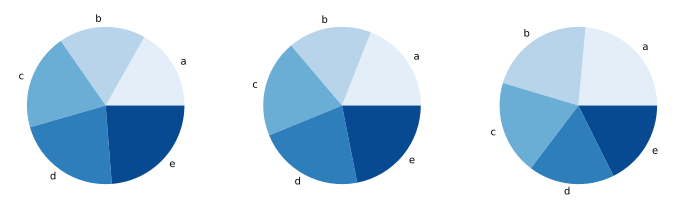

In [2]:
# prepare the data
data_1 = np.array([17, 18, 20, 22, 24])
data_2 = np.array([20, 18, 21, 23, 23])
data_3 = np.array([28, 26, 23, 21, 21])

data = np.array([data_1, data_2, data_3])
labels = np.array(['a', 'b', 'c', 'd', 'e'])

# generate the pie charts
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
for i, ax in enumerate(axes):
    ax.pie(x=data[i], labels=labels, colors=colors)

Not so easy to tell them apart, is it? There is, however, a much better way of visualizing the same data that will help us answer all of the questions posed above - a **bar chart**. Below you can see the same data visualized using bars instead of pie slices. Can you now try to answer the same questions about this dataset?

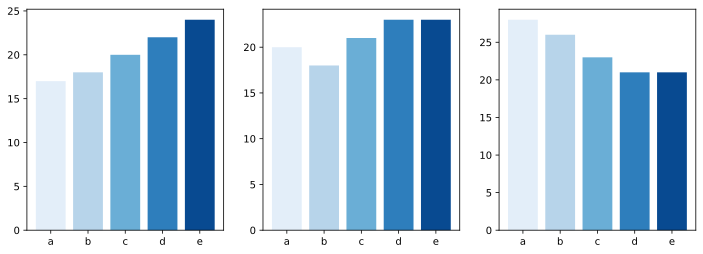

In [3]:
# generate the bar charts
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
for i, ax in enumerate(axes):
    ax.bar(labels, data[i], color=colors)

## Sorting the data

When using bar charts, we often first input the data to the plotting function as-is, without thinking much about the order of the categories on the resulting plot. While there is nothing particuarly wrong with doing that, it may be better to put some thought into the story you want to tell through that bar chart - often we are interested in identifying the category with the largest/smallest value(s). In such cases, you should sort the data points to order the categories by value and make it much easier to identify the interesting poinst.

```{warning}
**Note:** Never re-order an axis if it represents **temporal** values! It will only make the plot look more confusing. After all, we are very used to seeing May follow April, but not July follow November.
```

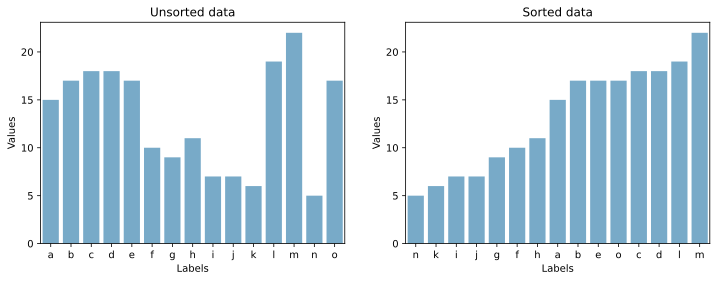

In [4]:
# prepare the data
labels = np.array(['a', 'b', 'c', 'd', 'e', 'f', 'g', 'h', 'i', 'j', 'k', 'l', 'm', 'n', 'o'])
data = np.random.randint(low=5, high=25, size=15)
data = pd.DataFrame({'Labels': labels, 'Values': data})

# generate the plots
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12, 4))

## unsorted
sns.barplot(data = data, x='Labels', y='Values', 
            ax=axes[0], color=colors[2])
## sorted
sns.barplot(data = data, x='Labels', y='Values', 
            order=data.sort_values('Values').Labels, 
            ax=axes[1], color=colors[2])

axes[0].set_title('Unsorted data')
axes[1].set_title('Sorted data');

## Overplotting

Imagine you have a dataset with _thousands_ of points. The intuition probably tells you to just take all of them and plot them directly. While there may be applications where it is useful or even necessary, it may also lead to hiding important information or even misinterpretation of the data.

Below you will see a plot where three different datasets, each comprising 7500 points, were plotted simultaneously. While you can see the general "shape" of the data, can you tell _exactly_ where points belonging to one dataset end and the other ones begin?

In [5]:
# generate the data
data_1 = pd.DataFrame({'x':np.random.normal(loc=10, scale=1.2, size=7500),
                       'y': np.random.normal(loc=10, scale=1.2, size=7500)})
data_2 = pd.DataFrame({'x':np.random.normal(loc=14.5, scale=1.2, size=7500),
                       'y': np.random.normal(loc=14.5, scale=1.2, size=7500)})
data_3 = pd.DataFrame({'x':np.random.normal(loc=9, scale=1.5, size=7500),
                       'y': np.random.normal(loc=15.5, scale=1.5, size=7500)})

data = {'data_1': data_1, 'data_2': data_2, 'data_3': data_3}

# plot the data one a single plot
fig, axes = plt.subplots(figsize=(5, 5))

for set in data.values():
    axes.scatter(x=set['x'], y=set['y'], color=colors[2])

axes.set_xlabel('x')
axes.set_ylabel('y');

There are a few techniques that you may use to make the differences between the datasets more obvious:
 - decrease point size
 - increase point transparency
 - color points belonging to different groups using different colors 
 - subsampling datasets
 - combinations of the above
 
See below for examples of each of those techniques and how they make the data more readable:

In [6]:
fig, axes = plt.subplots(nrows=2, ncols = 2, figsize=(9, 9))

for row in range(0,2):
    for col in range(0,2):
        if row==0 and col==0:
            for i, subset in enumerate(data.values()):
                axes[row, col].scatter(
                    x=subset['x'], y=subset['y'], color=colors[i]
                )
            axes[row, col].set_title('One color per dataset')
        elif row==0 and col==1:
            for subset in data.values():
                axes[row, col].scatter(
                    x=subset['x'], y=subset['y'], s=0.8, color=colors[2]
                )
            axes[row, col].set_title('Point size reduction')
        elif row==1 and col==0:
            for subset in data.values():
                axes[row, col].scatter(
                    x=subset['x'], y=subset['y'], alpha=0.04, color=colors[2]
                )
            axes[row, col].set_title('Transparency reduction')
        elif row==1 and col==1:
            # subsample
            subsample = {
                'sub_1': data_1.sample(1000, random_state=0), 
                'sub_2': data_2.sample(1000, random_state=0), 
                'sub_3': data_3.sample(1000, random_state=0)
            }
            # plot
            for subset in subsample.values():
                axes[row,col].scatter(
                    x=subset['x'], y=subset['y'], color=colors[2]
                )
            axes[row,col].set_title('Data points subsampling');

````{admonition} See also
:class: tip
If you want to learn more about how to deal with overplotting, check out [this resource](https://www.data-to-viz.com/caveat/overplotting.html).
````

## 3D plots

3D plots are a great tool to _interactively_ explore datasets with more than 2 variables. They allow you look at the data from different angles and zoom into areas where you need more resolution. However, when you project a 3D plot onto a 2D surface, i.e.: you fix the axes at certain angles and remove the interactivity, you may cause some data points to disappear from view, thereby potentially leading to plot misinterpretation.

Below you will see two 3D bar charts which have the interactivity removed - notice, how some bars are smaller than other ones and how, at this angle, it is nearly impossible to tell which values they correspond to.

In [7]:
# prepare the data
# pick 60 points from a random uniform distribution
# with bounds between 10 and 20

np.random.seed(0) # to have reproducible results

# numerical data
a = np.random.uniform(10, 20, 60)
b = np.random.uniform(10, 20, 60)
c = np.random.uniform(10, 20, 60)

# categorical data - categories are 1,2,3 for x and y 
x = np.array([1, 1, 1, 2, 2, 2, 3, 3, 3])
y = np.array([1, 2, 3, 1, 2, 3, 1, 2, 3])
z = np.random.uniform(10, 20, 9)

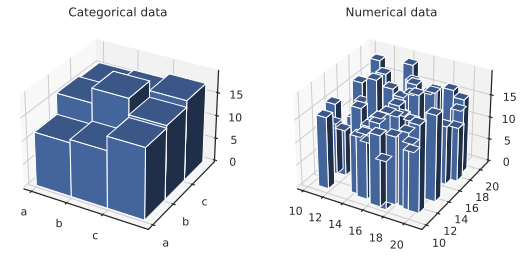

In [10]:
# 3D plot
fig = plt.figure(figsize=(9,4))
ax1 = fig.add_subplot(121, projection='3d')
ax2 = fig.add_subplot(122, projection='3d')

bottom = np.zeros_like(z)
width=depth=1
ax1.set_xticks(np.unique(x))
ax1.set_yticks(np.unique(y))
ax1.set_xticklabels(['a', 'b', 'c'])
ax1.set_yticklabels(['a', 'b', 'c'])
ax1.set_title('Categorical data')
ax1.bar3d(x, y, bottom, width, depth, z);

bottom = np.zeros_like(c)
ax2.set_title('Numerical data')
ax2.bar3d(a, b, bottom, width, depth, c);

Fortunately, there are other kinds of visualizations that can help you plot the same data without the risk of misrepresenting anything. If your data is mostly categorical (like in the bar chart on the left), you can substitute the bar char with a simple heatmap. Similarly, for numerical data you can use a bubble plot (a scatter plot with point size representing the 3rd dimension). Both of those plot types were discussed in [chapter 2](02_chart_types).

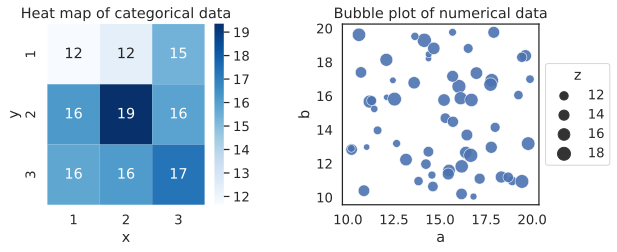

In [13]:
data_frame = pd.DataFrame({'x':x, 'y':y, 'z':z}).pivot('y', 'x', 'z')

sns.set(rc={'figure.figsize':(9, 4.5), 'font.family': [FONT_FAMILY]}, style='white')
with sns.plotting_context("notebook", font_scale=1.2):
    fig, (ax1, ax2) = plt.subplots(nrows=1, ncols=2)
    plt.tight_layout(pad = 4)
    # heatmap
    sns.heatmap(
        data=data_frame,
        cmap='Blues',
        annot=True,
        ax = ax1
    )
    ax1.set_title('Heat map of categorical data')
    
    # bubble plot
    ax2 = sns.scatterplot(
        x=a, 
        y=b, 
        size=c,
        sizes=(40, 200),
        alpha=0.6
    )
    ax2.set_xlabel('a')
    ax2.set_ylabel('b')
    ax2.set_title('Bubble plot of numerical data')
    ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    legend = ax2.get_legend()
    legend.set_title('z')